In [2]:
!pip install kaggle

In [3]:
# configuring the path of Kaggle.json file
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

İmporting the dog vs cat dataset from kaggle

In [4]:
# Kaggle api
!kaggle competitions download -c dogs-vs-cats

100% 812M/812M [00:11<00:00, 68.3MB/s]
100% 812M/812M [00:11<00:00, 71.6MB/s]


In [5]:
!ls

dogs-vs-cats.zip  kaggle.json  sample_data


In [6]:
# extracting the compressed dataset
from zipfile import ZipFile

dataset = '/content/dogs-vs-cats.zip'

with ZipFile(dataset, 'r') as zip:
  zip.extractall()
  print('The dataset is extracted')

The dataset is extracted


In [7]:
# extracting the compressed dataset
from zipfile import ZipFile

dataset = '/content/train.zip'

with ZipFile(dataset, 'r') as zip:
  zip.extractall()
  print('The dataset is extracted')

The dataset is extracted


In [8]:
import os
# counting the number of files in train folder
path, dirs, files = next(os.walk('/content/train'))
file_count = len(files)
print('Number of images: ', file_count)

Number of images:  25000


printing the name of images

In [9]:
file_names = os.listdir('/content/train/')
print(file_names)

['dog.2882.jpg', 'cat.9416.jpg', 'dog.8713.jpg', 'dog.6379.jpg', 'dog.11096.jpg', 'dog.6496.jpg', 'cat.10153.jpg', 'dog.8016.jpg', 'dog.2826.jpg', 'dog.5780.jpg', 'cat.2413.jpg', 'dog.8196.jpg', 'cat.2731.jpg', 'cat.4761.jpg', 'cat.12149.jpg', 'cat.1456.jpg', 'dog.12047.jpg', 'dog.6896.jpg', 'dog.6645.jpg', 'dog.1102.jpg', 'cat.11150.jpg', 'cat.6219.jpg', 'dog.342.jpg', 'cat.2079.jpg', 'dog.7083.jpg', 'cat.8061.jpg', 'cat.10514.jpg', 'cat.4770.jpg', 'dog.2647.jpg', 'cat.5002.jpg', 'cat.8127.jpg', 'dog.7971.jpg', 'cat.9010.jpg', 'cat.9788.jpg', 'dog.476.jpg', 'cat.7843.jpg', 'dog.9687.jpg', 'cat.6330.jpg', 'cat.3111.jpg', 'dog.10551.jpg', 'dog.135.jpg', 'dog.206.jpg', 'cat.6384.jpg', 'cat.4834.jpg', 'cat.167.jpg', 'dog.1035.jpg', 'dog.6908.jpg', 'dog.5623.jpg', 'dog.6349.jpg', 'dog.9786.jpg', 'cat.9940.jpg', 'cat.7744.jpg', 'dog.5750.jpg', 'cat.6269.jpg', 'dog.7038.jpg', 'dog.4400.jpg', 'dog.8702.jpg', 'cat.3638.jpg', 'cat.4162.jpg', 'dog.10836.jpg', 'dog.461.jpg', 'dog.2904.jpg', 'dog.

Importing the dependencies

In [10]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.model_selection import train_test_split
from google.colab.patches import cv2_imshow

displaying the images of dogs and cats

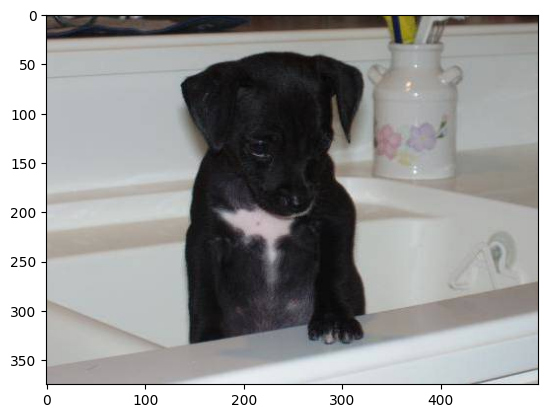

In [11]:
# display dog image
img = mpimg.imread('/content/train/dog.8298.jpg')
imgplt = plt.imshow(img)
plt.show()

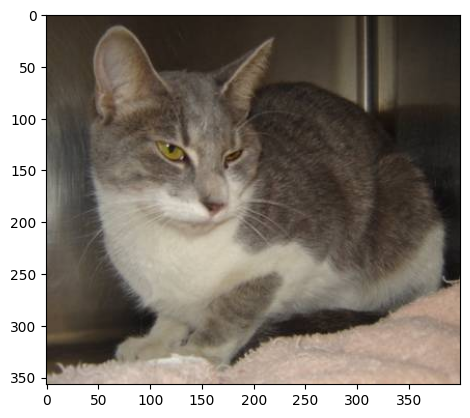

In [12]:
# display cat image
img = mpimg.imread('/content/train/cat.4352.jpg')
imgplt = plt.imshow(img)
plt.show()

In [13]:
file_names = os.listdir('/content/train')

dog_count = 0
cat_count = 0

for i in file_names:
  name = i[0:3]
  if name == 'dog':
    dog_count += 1
  else :
    cat_count += 1

    print('dog count: ', dog_count)
  print('cat count: ', cat_count)

Görüntülenen çıkış son 5000 satıra kısaltıldı.
cat count:  10824
cat count:  10824
dog count:  10854
cat count:  10825
cat count:  10825
dog count:  10855
cat count:  10826
dog count:  10855
cat count:  10827
dog count:  10855
cat count:  10828
cat count:  10828
dog count:  10856
cat count:  10829
cat count:  10829
cat count:  10829
dog count:  10858
cat count:  10830
cat count:  10830
cat count:  10830
cat count:  10830
cat count:  10830
cat count:  10830
cat count:  10830
cat count:  10830
dog count:  10865
cat count:  10831
cat count:  10831
dog count:  10866
cat count:  10832
cat count:  10832
dog count:  10867
cat count:  10833
cat count:  10833
dog count:  10868
cat count:  10834
cat count:  10834
dog count:  10869
cat count:  10835
cat count:  10835
cat count:  10835
dog count:  10871
cat count:  10836
cat count:  10836
dog count:  10872
cat count:  10837
cat count:  10837
cat count:  10837
cat count:  10837
dog count:  10875
cat count:  10838
cat count:  10838
dog count:  10876

Resizing all the images  

In [14]:
#creating a directory for resized images
os.mkdir('/content/image_resized')

In [15]:
original_folder = '/content/train/'
resized_folder = '/content/image_resized/'

for i in range(2000):
 filename = os.listdir(original_folder)[i]
 img_path = original_folder+filename

 img = Image.open(img_path)
 img = img.resize((224,224))
 img = img.convert('RGB')

 newImgPath = resized_folder+filename
 img.save(newImgPath)


In [16]:
import os
print(os.listdir('/content/image_resized/'))


['dog.2882.jpg', 'cat.9416.jpg', 'dog.8713.jpg', 'dog.6379.jpg', 'dog.11096.jpg', 'dog.6496.jpg', 'cat.10153.jpg', 'dog.8016.jpg', 'dog.2826.jpg', 'dog.5780.jpg', 'cat.2413.jpg', 'dog.8196.jpg', 'cat.2731.jpg', 'cat.4761.jpg', 'cat.12149.jpg', 'cat.1456.jpg', 'dog.12047.jpg', 'dog.6896.jpg', 'dog.6645.jpg', 'dog.1102.jpg', 'cat.11150.jpg', 'cat.6219.jpg', 'dog.342.jpg', 'cat.2079.jpg', 'dog.7083.jpg', 'cat.8061.jpg', 'cat.10514.jpg', 'cat.4770.jpg', 'dog.2647.jpg', 'cat.5002.jpg', 'cat.8127.jpg', 'dog.7971.jpg', 'cat.9010.jpg', 'cat.9788.jpg', 'dog.476.jpg', 'cat.7843.jpg', 'dog.9687.jpg', 'cat.6330.jpg', 'cat.3111.jpg', 'dog.10551.jpg', 'dog.135.jpg', 'dog.206.jpg', 'cat.6384.jpg', 'cat.4834.jpg', 'cat.167.jpg', 'dog.1035.jpg', 'dog.6908.jpg', 'dog.5623.jpg', 'dog.6349.jpg', 'dog.9786.jpg', 'cat.9940.jpg', 'cat.7744.jpg', 'dog.5750.jpg', 'cat.6269.jpg', 'dog.7038.jpg', 'dog.4400.jpg', 'dog.8702.jpg', 'cat.3638.jpg', 'cat.4162.jpg', 'dog.10836.jpg', 'dog.461.jpg', 'dog.2904.jpg', 'dog.

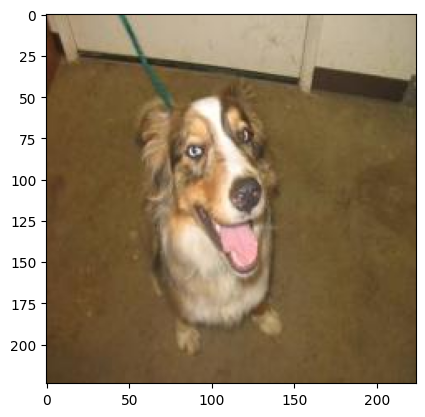

In [17]:
#display resized dog image
img = mpimg.imread('/content/image_resized/dog.2882.jpg')
imgplot = plt.imshow(img)
plt.show()


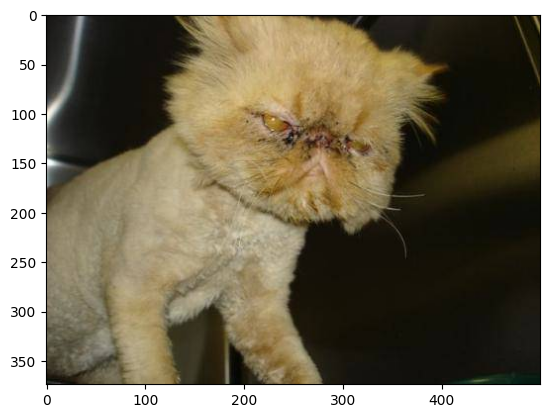

In [18]:
#display resized cat image
img = mpimg.imread('/content/train/cat.9416.jpg')
imgplot = plt.imshow(img)
plt.show()

creating labels for resized images of dogs and cats

cat --> 0
dog --> 1

In [19]:
# Klasörden dosya isimlerini listele
filenames = os.listdir('/content/image_resized/')
labels = []

for i in range(2000):
    file_name = filenames[i]
    label = file_name[0:3]

    if label == 'dog':
        labels.append(1)
    else:
        labels.append(0)


In [20]:
print(labels[0:5])
print(len(labels))

[1, 0, 1, 1, 1]
2000


In [21]:
#counting the images of dogs and cats out of 2000 images
values,counts = np.unique(labels,return_counts=True)
print(values)
print(counts)

[0 1]
[1013  987]


converting all the resized images to numpy arrays

In [22]:
import cv2
import glob

In [23]:
image_directory = '/content/image_resized/'
image_extension = ['png', 'jpg']

files = []

[files.extend(glob.glob(image_directory + '*.' + e)) for e in image_extension]

dog_cat_images = np.asarray([cv2.imread(file) for file in files])

In [24]:
print(dog_cat_images)

[[[[105 125 156]
   [112 133 164]
   [117 139 167]
   ...
   [133 159 171]
   [132 158 170]
   [132 158 170]]

  [[ 94 114 145]
   [109 130 161]
   [118 140 168]
   ...
   [135 161 173]
   [134 160 172]
   [133 159 171]]

  [[ 78  98 129]
   [103 124 155]
   [120 142 170]
   ...
   [136 162 174]
   [135 161 173]
   [135 161 173]]

  ...

  [[ 31  58  78]
   [ 32  59  79]
   [ 33  60  80]
   ...
   [ 42  72  89]
   [ 42  72  89]
   [ 43  73  90]]

  [[ 32  59  79]
   [ 32  59  79]
   [ 33  60  80]
   ...
   [ 41  71  88]
   [ 41  71  88]
   [ 42  72  89]]

  [[ 32  59  79]
   [ 33  60  80]
   [ 34  61  81]
   ...
   [ 39  69  86]
   [ 40  70  87]
   [ 41  71  88]]]


 [[[ 18  21  25]
   [ 19  22  26]
   [ 22  24  25]
   ...
   [ 88 120 126]
   [  1  37  43]
   [ 35  75  80]]

  [[ 18  21  25]
   [ 19  22  26]
   [ 22  24  25]
   ...
   [ 89 118 125]
   [ 12  48  54]
   [ 20  60  65]]

  [[ 18  21  25]
   [ 19  22  26]
   [ 22  24  25]
   ...
   [ 85 114 121]
   [ 32  68  74]
   [  2  42

In [25]:
type(dog_cat_images)

numpy.ndarray

In [26]:
print(dog_cat_images.shape)

(2000, 224, 224, 3)


In [27]:
X = dog_cat_images
Y = np.asarray(labels)

Train Test Split

In [28]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=2)

In [29]:
print(X.shape, X_train.shape, X_test.shape)

(2000, 224, 224, 3) (1600, 224, 224, 3) (400, 224, 224, 3)


1600 TRAİNİNG İMAGES
400 TEST İMAGES

In [30]:
#SCALİNG THE DATA
X_train_scaled = X_train/255
X_test_scaled = X_test/255

In [31]:
print(X_train_scaled)

[[[[0.09411765 0.14117647 0.15686275]
   [0.09411765 0.14117647 0.15686275]
   [0.09411765 0.14117647 0.15686275]
   ...
   [0.3254902  0.6745098  0.75294118]
   [0.3254902  0.6745098  0.75294118]
   [0.3254902  0.6745098  0.75294118]]

  [[0.09411765 0.14117647 0.15686275]
   [0.09411765 0.14117647 0.15686275]
   [0.09411765 0.14117647 0.15686275]
   ...
   [0.32156863 0.67058824 0.74901961]
   [0.32156863 0.67058824 0.74901961]
   [0.32156863 0.67058824 0.74901961]]

  [[0.09411765 0.14117647 0.15686275]
   [0.09411765 0.14117647 0.15686275]
   [0.09411765 0.14117647 0.15686275]
   ...
   [0.31764706 0.66666667 0.74901961]
   [0.31764706 0.66666667 0.74901961]
   [0.31764706 0.66666667 0.74901961]]

  ...

  [[0.6745098  0.74117647 0.79215686]
   [0.66666667 0.73333333 0.78431373]
   [0.66666667 0.73333333 0.78431373]
   ...
   [0.68627451 0.80392157 0.84705882]
   [0.67843137 0.79607843 0.83921569]
   [0.6745098  0.79215686 0.83529412]]

  [[0.69411765 0.76078431 0.81176471]
   [0.6

In [32]:
!pip install tensorflow==2.14
!pip install tensorflow-hub==0.15


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 489.8/489.8 MB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 32.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 39.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 68.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.7/440.7 kB 20.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 4.4 MB/s eta 0:00:00
  Attempting uninstall: wrapt
    Found existing installation: wrapt 1.16.0
    Uninstalling wrapt-1.16.0:
      Successfully uninstalled wrapt-1.16.0
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.0
    Uninstalling ml-dtypes-0.4.0:
      Successfully uninstalled ml-dtypes-0.4.0
  Attempting uninstall: keras
    Found existing installation: keras 3.4.1
    Uninstalling keras-3.4.1:
      Successfully uninstalled keras-3.4.1
  Attempting uninstall: google-auth-oauthlib
    Found existing ins

Building the neutral network

In [33]:
import tensorflow as tf
import tensorflow_hub as hub

mobilenet_model = 'https://tfhub.dev/google/tf2-preview/mobilenet_v2/feature_vector/4'
pretrained_model = hub.KerasLayer(mobilenet_model, input_shape=(224,224,3), trainable=False)

# Model yapısını oluştur
model = tf.keras.Sequential([
    pretrained_model,
    tf.keras.layers.Dense(2, activation='softmax')
])

# Model özeti
model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1280)              2257984   
                                                                 
 dense (Dense)               (None, 2)                 2562      
                                                                 
Total params: 2260546 (8.62 MB)
Trainable params: 2562 (10.01 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


In [34]:
model.compile(
    optimizer='adam',
    loss= tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['acc']
)

In [35]:
model.fit(X_train_scaled, Y_train, epochs=5)

Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5729: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Softmax activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


50/50 [==============================] - 96s 2s/step - loss: 0.2232 - acc: 0.9094
Epoch 2/5
50/50 [==============================] - 72s 1s/step - loss: 0.0796 - acc: 0.9731
Epoch 3/5
50/50 [==============================] - 73s 1s/step - loss: 0.0645 - acc: 0.9781
Epoch 4/5
50/50 [==============================] - 78s 2s/step - loss: 0.0502 - acc: 0.9856
Epoch 5/5
50/50 [==============================] - 79s 2s/step - loss: 0.0425 - acc: 0.9862


In [36]:
score, acc = model.evaluate(X_test_scaled, Y_test)
print('Test score:', score)
print('Test accuracy:', acc)

13/13 [==============================] - 17s 1s/step - loss: 0.0335 - acc: 0.9875
Test score: 0.03353075310587883
Test accuracy: 0.987500011920929


predictive system

path of the image to be predicted/content/dog.jpg


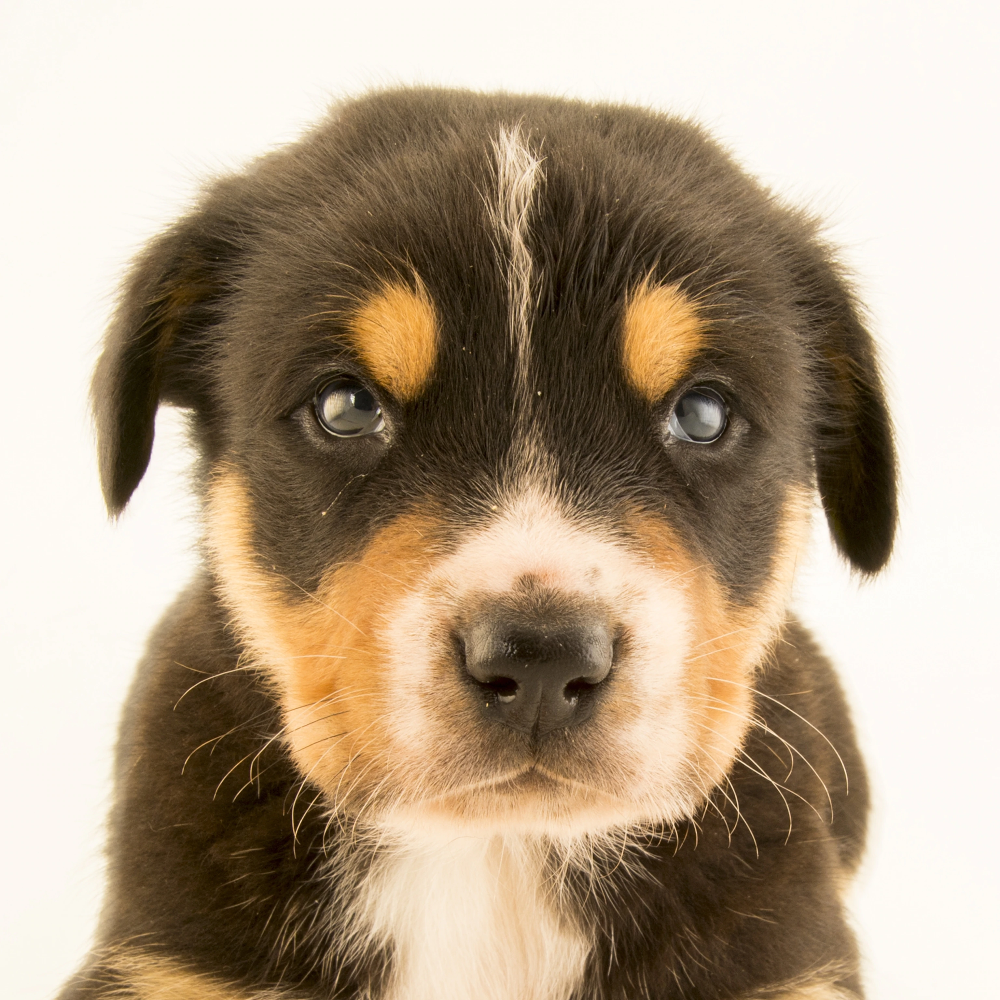

1/1 [==============================] - 0s 106ms/step
[[0.0036302  0.99636984]]
1
The image is a dog


In [39]:
input_image_path = input('path of the image to be predicted')


input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resize = cv2.resize(input_image, (224,224))

input_image_scaled = input_image_resize/255

image_reshaped = np.reshape(input_image_scaled, [1,224,224,3])

input_prediction = model.predict(image_reshaped)

print(input_prediction)

input_pred_label = np.argmax(input_prediction)


print(input_pred_label )

if input_pred_label == 0:
  print('The image is a cat')
else:
  print('The image is a dog')

path of the image to be predicted/content/cat.jpg


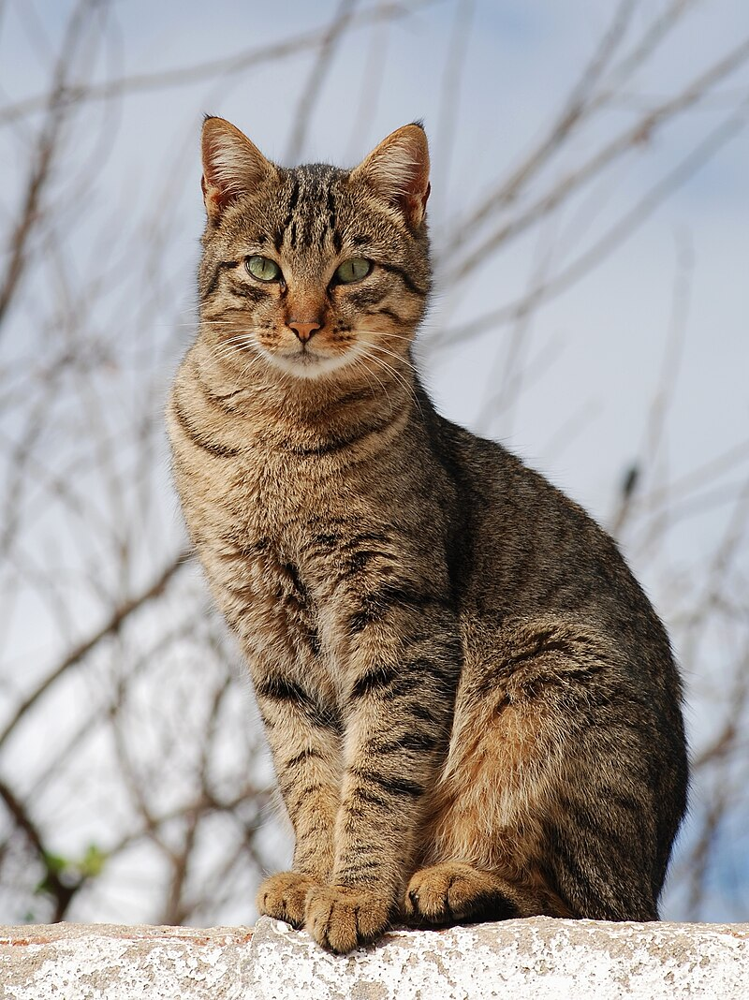

1/1 [==============================] - 0s 84ms/step
[[0.9817708  0.01822916]]
0
The image is a cat


In [40]:
input_image_path = input('path of the image to be predicted')


input_image = cv2.imread(input_image_path)

cv2_imshow(input_image)

input_image_resize = cv2.resize(input_image, (224,224))

input_image_scaled = input_image_resize/255

image_reshaped = np.reshape(input_image_scaled, [1,224,224,3])

input_prediction = model.predict(image_reshaped)

print(input_prediction)

input_pred_label = np.argmax(input_prediction)


print(input_pred_label )

if input_pred_label == 0:
  print('The image is a cat')
else:
  print('The image is a dog')